# Train a diffusion model

Unconditional image generation is a popular application of diffusion models that generates images that look like those in the dataset used for training. Typically, the best results are obtained from finetuning a pretrained model on a specific dataset. You can find many of these checkpoints on the [Hub](https://huggingface.co/search/full-text?q=unconditional-image-generation&type=model), but if you can't find one you like, you can always train your own!

This tutorial will teach you how to train a [UNet2DModel](https://huggingface.co/docs/diffusers/main/en/api/models/unet2d#diffusers.UNet2DModel) from scratch on a subset of the [Smithsonian Butterflies](https://huggingface.co/datasets/huggan/smithsonian_butterflies_subset) dataset to generate your own 🦋 butterflies 🦋.

<Tip>

💡 This training tutorial is based on the [Training with 🧨 Diffusers](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/training_example.ipynb) notebook. For additional details and context about diffusion models like how they work, check out the notebook!

</Tip>

Before you begin, make sure you have 🤗 Datasets installed to load and preprocess image datasets, and 🤗 Accelerate, to simplify training on any number of GPUs. The following command will also install [TensorBoard](https://www.tensorflow.org/tensorboard) to visualize training metrics (you can also use [Weights & Biases](https://docs.wandb.ai/) to track your training).

In [1]:
# uncomment to install the necessary libraries in Colab
!pip install diffusers[training]

We encourage you to share your model with the community, and in order to do that, you'll need to login to your Hugging Face account (create one [here](https://hf.co/join) if you don't already have one!). You can login from a notebook and enter your token when prompted:

In [2]:
from huggingface_hub import notebook_login

notebook_login()

Or login in from the terminal:

```bash
huggingface-cli login
```

Since the model checkpoints are quite large, install [Git-LFS](https://git-lfs.com/) to version these large files:

```bash
!sudo apt -qq install git-lfs
!git config --global credential.helper store
```

## Training configuration

For convenience, create a `TrainingConfig` class containing the training hyperparameters (feel free to adjust them):

In [19]:
from dataclasses import dataclass


@dataclass
class TrainingConfig:
    image_size = 128  # the generated image resolution
    train_batch_size = 16
    eval_batch_size = 16  # how many images to sample during evaluation
    num_epochs = 50
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 10
    save_model_epochs = 30
    mixed_precision = "fp16"  # `no` for float32, `fp16` for automatic mixed precision
    output_dir = "ddpm-butterflies-128"  # the model name locally and on the HF Hub

    push_to_hub = True  # whether to upload the saved model to the HF Hub
    hub_private_repo = False
    overwrite_output_dir = True  # overwrite the old model when re-running the notebook
    seed = 0


config = TrainingConfig()

## Load the dataset

You can easily load the [Smithsonian Butterflies](https://huggingface.co/datasets/huggan/smithsonian_butterflies_subset) dataset with the 🤗 Datasets library:

In [4]:
from datasets import load_dataset

config.dataset_name = "christianc750/nes_covers"
dataset = load_dataset(config.dataset_name, split="train")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/125 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/742 [00:00<?, ?it/s]

1942 (USA).png:   0%|          | 0.00/653k [00:00<?, ?B/s]

1943 (USA).png:   0%|          | 0.00/849k [00:00<?, ?B/s]

10-Yard Fight (USA).png:   0%|          | 0.00/197k [00:00<?, ?B/s]

Advanced D&D - Hillsfar (USA).png:   0%|          | 0.00/840k [00:00<?, ?B/s]

(…)The - Pugsley_s Scavenger Hunt (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

3-D Worldrunner (USA).png:   0%|          | 0.00/676k [00:00<?, ?B/s]

Advanced D&D - DragonStrike (USA).png:   0%|          | 0.00/738k [00:00<?, ?B/s]

A Boy and His Blob (USA).png:   0%|          | 0.00/659k [00:00<?, ?B/s]

Abadox (USA).png:   0%|          | 0.00/776k [00:00<?, ?B/s]

A Nightmare on Elm Street (USA).png:   0%|          | 0.00/862k [00:00<?, ?B/s]

(…)nced D&D - Heroes of the Lance (USA).png:   0%|          | 0.00/825k [00:00<?, ?B/s]

Action 52 (USA) (Unl).png:   0%|          | 0.00/600k [00:00<?, ?B/s]

8 Eyes (USA).png:   0%|          | 0.00/838k [00:00<?, ?B/s]

Addams Family, The (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/404k [00:00<?, ?B/s]

720 Degrees (USA).png:   0%|          | 0.00/404k [00:00<?, ?B/s]

Adventure Island 2 (USA).png:   0%|          | 0.00/657k [00:00<?, ?B/s]

(…)dvanced D&D - Pool of Radiance (USA).png:   0%|          | 0.00/755k [00:00<?, ?B/s]

Adventure Island 3 (USA).png:   0%|          | 0.00/759k [00:00<?, ?B/s]

(…)dventures in the Magic Kingdom (USA).png:   0%|          | 0.00/711k [00:00<?, ?B/s]

Adventures of Lolo 3 (USA).png:   0%|          | 0.00/985k [00:00<?, ?B/s]

Adventure Island (USA).png:   0%|          | 0.00/732k [00:00<?, ?B/s]

(…)ures of Gilligan_s Island, The (USA).png:   0%|          | 0.00/979k [00:00<?, ?B/s]

Adventures of Tom Sawyer (USA).png:   0%|          | 0.00/1.18M [00:00<?, ?B/s]

Air Fortress (USA).png:   0%|          | 0.00/794k [00:00<?, ?B/s]

Adventures of Rad Gravity, The (USA).png:   0%|          | 0.00/812k [00:00<?, ?B/s]

Adventures of Dino Riki (USA).png:   0%|          | 0.00/551k [00:00<?, ?B/s]

Adventures of Lolo (USA).png:   0%|          | 0.00/821k [00:00<?, ?B/s]

(…)fterburner (USA) (Tengen Unlicensed).png:   0%|          | 0.00/664k [00:00<?, ?B/s]

Adventures of Bayou Billy, The (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Adventures of Lolo 2 (USA).png:   0%|          | 0.00/867k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/869k [00:00<?, ?B/s]

(…)s of Rocky and Bullwinkle, The (USA).png:   0%|          | 0.00/517k [00:00<?, ?B/s]

Airwolf (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Al Unser Jr. Turbo Racing (USA).png:   0%|          | 0.00/868k [00:00<?, ?B/s]

Alfred Chicken (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Alien 3 (USA).png:   0%|          | 0.00/247k [00:00<?, ?B/s]

(…)n Syndrome (USA) (Tengen Unlicensed).png:   0%|          | 0.00/745k [00:00<?, ?B/s]

Anticipation (USA).png:   0%|          | 0.00/607k [00:00<?, ?B/s]

American Gladiators (USA).png:   0%|          | 0.00/975k [00:00<?, ?B/s]

Arch Rivals - A Basketbrawl! (USA).png:   0%|          | 0.00/838k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/801k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/608k [00:00<?, ?B/s]

Amagon (USA).png:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

All-Pro Basketball (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Alpha Mission (USA).png:   0%|          | 0.00/714k [00:00<?, ?B/s]

Archon (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Arkista_s Ring (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Astyanax (USA).png:   0%|          | 0.00/801k [00:00<?, ?B/s]

Athletic World (USA).png:   0%|          | 0.00/704k [00:00<?, ?B/s]

Athena (USA).png:   0%|          | 0.00/680k [00:00<?, ?B/s]

Attack of the Killer Tomatoes (USA).png:   0%|          | 0.00/651k [00:00<?, ?B/s]

(…)noid (USA, Custom Standard Box Size).png:   0%|          | 0.00/295k [00:00<?, ?B/s]

Back to the Future (USA).png:   0%|          | 0.00/763k [00:00<?, ?B/s]

(…)ck to the Future Part II & III (USA).png:   0%|          | 0.00/1.17M [00:00<?, ?B/s]

Bad News Baseball (USA).png:   0%|          | 0.00/817k [00:00<?, ?B/s]

Balloon Fight (USA).png:   0%|          | 0.00/147k [00:00<?, ?B/s]

(…) Golf - Challenge Pebble Beach (USA).png:   0%|          | 0.00/879k [00:00<?, ?B/s]

Bad Dudes (USA).png:   0%|          | 0.00/763k [00:00<?, ?B/s]

Barker Bill_s Trick Shooting (USA).png:   0%|          | 0.00/958k [00:00<?, ?B/s]

Barbie (USA).png:   0%|          | 0.00/558k [00:00<?, ?B/s]

Baseball Stars II (USA).png:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

Bandit Kings of Ancient China (USA).png:   0%|          | 0.00/828k [00:00<?, ?B/s]

Baseball Stars (USA).png:   0%|          | 0.00/732k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/906k [00:00<?, ?B/s]

Bad Street Brawler (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Baseball Simulator 1.000 (USA).png:   0%|          | 0.00/906k [00:00<?, ?B/s]

Baseball (USA).png:   0%|          | 0.00/170k [00:00<?, ?B/s]

Bard_s Tale, The (USA).png:   0%|          | 0.00/630k [00:00<?, ?B/s]

(…)se Wars - Cyber Stadium Series (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/519k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/542k [00:00<?, ?B/s]

Bases Loaded 2 (USA).png:   0%|          | 0.00/461k [00:00<?, ?B/s]

Bases Loaded (USA).png:   0%|          | 0.00/518k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/461k [00:00<?, ?B/s]

Battleship (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

Bases Loaded 3 (USA).png:   0%|          | 0.00/541k [00:00<?, ?B/s]

Bases Loaded 4 (USA).png:   0%|          | 0.00/711k [00:00<?, ?B/s]

Batman - The Video Game (USA).png:   0%|          | 0.00/674k [00:00<?, ?B/s]

Batman - Return of the Joker (USA).png:   0%|          | 0.00/623k [00:00<?, ?B/s]

Battletank, Garry Kitchen_s (USA).png:   0%|          | 0.00/674k [00:00<?, ?B/s]

Batman Returns (USA).png:   0%|          | 0.00/974k [00:00<?, ?B/s]

Battle Chess (USA).png:   0%|          | 0.00/894k [00:00<?, ?B/s]

Battle of Olympus, The (USA).png:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

Battletoads (USA).png:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

Beetlejuice (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Battletoads-Double Dragon (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Bigfoot (USA).png:   0%|          | 0.00/927k [00:00<?, ?B/s]

(…)Excellent Video Game Adventure (USA).png:   0%|          | 0.00/520k [00:00<?, ?B/s]

(…)the Best - Championship Karate (USA).png:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

Blades of Steel (USA).png:   0%|          | 0.00/720k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/570k [00:00<?, ?B/s]

Blaster Master (USA).png:   0%|          | 0.00/986k [00:00<?, ?B/s]

Boulder Dash (USA).png:   0%|          | 0.00/766k [00:00<?, ?B/s]

(…) Time - The National Pool Tour (USA).png:   0%|          | 0.00/577k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/676k [00:00<?, ?B/s]

Bo Jackson Baseball (USA).png:   0%|          | 0.00/792k [00:00<?, ?B/s]

Bonk_s Adventure (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Blues Brothers, The (USA).png:   0%|          | 0.00/992k [00:00<?, ?B/s]

(…)ill Elliott_s NASCAR Challenge (USA).png:   0%|          | 0.00/770k [00:00<?, ?B/s]

Blue Marlin, The (USA).png:   0%|          | 0.00/570k [00:00<?, ?B/s]

Black Bass, The (USA).png:   0%|          | 0.00/675k [00:00<?, ?B/s]

Bomberman (USA).png:   0%|          | 0.00/332k [00:00<?, ?B/s]

Bionic Commando (USA).png:   0%|          | 0.00/856k [00:00<?, ?B/s]

Bomberman II (USA).png:   0%|          | 0.00/661k [00:00<?, ?B/s]

Bram Stoker_s Dracula (USA).png:   0%|          | 0.00/938k [00:00<?, ?B/s]

BreakThru (USA).png:   0%|          | 0.00/810k [00:00<?, ?B/s]

Bump _n_ Jump (USA).png:   0%|          | 0.00/878k [00:00<?, ?B/s]

Bubble Bobble Part 2 (USA).png:   0%|          | 0.00/659k [00:00<?, ?B/s]

Cabal (USA).png:   0%|          | 0.00/854k [00:00<?, ?B/s]

California Games (USA).png:   0%|          | 0.00/801k [00:00<?, ?B/s]

Bucky O_Hare (USA).png:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

Bubble Bobble (USA).png:   0%|          | 0.00/584k [00:00<?, ?B/s]

(…)com_s Gold Medal Challenge _92 (USA).png:   0%|          | 0.00/826k [00:00<?, ?B/s]

Burai Fighter (USA).png:   0%|          | 0.00/656k [00:00<?, ?B/s]

Bugs Bunny - Birthday Blowout (USA).png:   0%|          | 0.00/971k [00:00<?, ?B/s]

BurgerTime (USA).png:   0%|          | 0.00/809k [00:00<?, ?B/s]

Bugs Bunny - Crazy Castle (USA).png:   0%|          | 0.00/627k [00:00<?, ?B/s]

(…)ptain America and the Avengers (USA).png:   0%|          | 0.00/916k [00:00<?, ?B/s]

Caesars Palace (USA).png:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/627k [00:00<?, ?B/s]

(…)tain Planet and the Planeteers (USA).png:   0%|          | 0.00/583k [00:00<?, ?B/s]

Casino Kid (USA).png:   0%|          | 0.00/601k [00:00<?, ?B/s]

Captain Skyhawk (USA).png:   0%|          | 0.00/792k [00:00<?, ?B/s]

Casino Kid II (USA).png:   0%|          | 0.00/818k [00:00<?, ?B/s]

Castlevania (USA).png:   0%|          | 0.00/667k [00:00<?, ?B/s]

Championship Pool (USA).png:   0%|          | 0.00/851k [00:00<?, ?B/s]

Castelian (USA).png:   0%|          | 0.00/765k [00:00<?, ?B/s]

Championship Bowling (USA).png:   0%|          | 0.00/592k [00:00<?, ?B/s]

Chessmaster, The (USA).png:   0%|          | 0.00/666k [00:00<?, ?B/s]

Chip n Dale Rescue Rangers 2 (USA).png:   0%|          | 0.00/910k [00:00<?, ?B/s]

Chip n Dale Rescue Rangers (USA).png:   0%|          | 0.00/916k [00:00<?, ?B/s]

Castlevania III (USA).png:   0%|          | 0.00/647k [00:00<?, ?B/s]

Caveman Games (USA).png:   0%|          | 0.00/507k [00:00<?, ?B/s]

Castlequest (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Castle of Dragon (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Chubby Cherub (USA).png:   0%|          | 0.00/397k [00:00<?, ?B/s]

Castlevania II (USA).png:   0%|          | 0.00/634k [00:00<?, ?B/s]

(…)n Lendl in Top Players_ Tennis (USA).png:   0%|          | 0.00/591k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/608k [00:00<?, ?B/s]

City Connection (USA).png:   0%|          | 0.00/608k [00:00<?, ?B/s]

Clash at Demonhead (USA).png:   0%|          | 0.00/1.19M [00:00<?, ?B/s]

Cobra Command (USA).png:   0%|          | 0.00/865k [00:00<?, ?B/s]

Clu Clu Land (USA).png:   0%|          | 0.00/194k [00:00<?, ?B/s]

Cliffhanger (USA).png:   0%|          | 0.00/971k [00:00<?, ?B/s]

Circus Caper (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Contra Force (USA).png:   0%|          | 0.00/1.14M [00:00<?, ?B/s]

Codename - Viper (USA).png:   0%|          | 0.00/929k [00:00<?, ?B/s]

Conquest of the Crystal Palace (USA).png:   0%|          | 0.00/1.17M [00:00<?, ?B/s]

Color a Dinosaur (USA).png:   0%|          | 0.00/326k [00:00<?, ?B/s]

Conflict (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Conan (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Commando (USA).png:   0%|          | 0.00/696k [00:00<?, ?B/s]

Cool World (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Classic Concentration (USA).png:   0%|          | 0.00/482k [00:00<?, ?B/s]

Cowboy Kid (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Cobra Triangle (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

Contra (USA).png:   0%|          | 0.00/740k [00:00<?, ?B/s]

(…)_n the Boys - Street Challenge (USA).png:   0%|          | 0.00/850k [00:00<?, ?B/s]

Crystalis (USA).png:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

Cyberball (USA).png:   0%|          | 0.00/746k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/641k [00:00<?, ?B/s]

Dance Aerobics (USA).png:   0%|          | 0.00/640k [00:00<?, ?B/s]

(…)bernoid - The Fighting Machine (USA).png:   0%|          | 0.00/832k [00:00<?, ?B/s]

Danny Sullivan_s Indy Heat (USA).png:   0%|          | 0.00/507k [00:00<?, ?B/s]

(…)ash Galaxy in the Alien Asylum (USA).png:   0%|          | 0.00/963k [00:00<?, ?B/s]

Darkwing Duck (USA).png:   0%|          | 0.00/781k [00:00<?, ?B/s]

Day Dreamin_ Davey (USA).png:   0%|          | 0.00/985k [00:00<?, ?B/s]

Darkman (USA).png:   0%|          | 0.00/784k [00:00<?, ?B/s]

Days of Thunder (USA).png:   0%|          | 0.00/908k [00:00<?, ?B/s]

Defender II (USA).png:   0%|          | 0.00/765k [00:00<?, ?B/s]

Deadly Towers (USA).png:   0%|          | 0.00/684k [00:00<?, ?B/s]

Defenders of Dynatron City (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

Deja Vu (USA).png:   0%|          | 0.00/758k [00:00<?, ?B/s]

Defender of the Crown (USA).png:   0%|          | 0.00/922k [00:00<?, ?B/s]

Demon Sword (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Desert Commander (USA).png:   0%|          | 0.00/813k [00:00<?, ?B/s]

Destination Earthstar (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Dick Tracy (USA).png:   0%|          | 0.00/382k [00:00<?, ?B/s]

Digger T. Rock (USA).png:   0%|          | 0.00/883k [00:00<?, ?B/s]

Donkey Kong (USA).png:   0%|          | 0.00/282k [00:00<?, ?B/s]

Die Hard (USA).png:   0%|          | 0.00/941k [00:00<?, ?B/s]

Destiny of an Emperor (USA).png:   0%|          | 0.00/865k [00:00<?, ?B/s]

Donkey Kong 3 (USA).png:   0%|          | 0.00/209k [00:00<?, ?B/s]

Dirty Harry (USA).png:   0%|          | 0.00/464k [00:00<?, ?B/s]

(…)g Dug II - Trouble in Paradise (USA).png:   0%|          | 0.00/478k [00:00<?, ?B/s]

Donkey Kong Jr. (USA).png:   0%|          | 0.00/197k [00:00<?, ?B/s]

Double Dare (USA).png:   0%|          | 0.00/683k [00:00<?, ?B/s]

Donkey Kong Jr. Math (USA).png:   0%|          | 0.00/167k [00:00<?, ?B/s]

Donkey Kong Classics (USA).png:   0%|          | 0.00/759k [00:00<?, ?B/s]

Double Dragon (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

Double Dragon III (USA).png:   0%|          | 0.00/1.17M [00:00<?, ?B/s]

Double Dribble (USA).png:   0%|          | 0.00/713k [00:00<?, ?B/s]

Double Dragon II (USA).png:   0%|          | 0.00/1.20M [00:00<?, ?B/s]

Dr. Jekyll and Mr. Hyde (USA).png:   0%|          | 0.00/875k [00:00<?, ?B/s]

Dr. Chaos (USA).png:   0%|          | 0.00/695k [00:00<?, ?B/s]

Duck Hunt (USA).png:   0%|          | 0.00/110k [00:00<?, ?B/s]

Dragon Fighter (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Dragon Warrior II (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Dragon_s Lair (USA).png:   0%|          | 0.00/960k [00:00<?, ?B/s]

Dragon Power (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Dragon Warrior IV (USA).png:   0%|          | 0.00/550k [00:00<?, ?B/s]

Dragon Warrior (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Dr. Mario (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

Dragon Spirit (USA).png:   0%|          | 0.00/892k [00:00<?, ?B/s]

Dragon Warrior III (USA).png:   0%|          | 0.00/918k [00:00<?, ?B/s]

DuckTales 2 (USA).png:   0%|          | 0.00/978k [00:00<?, ?B/s]

DuckTales (USA).png:   0%|          | 0.00/894k [00:00<?, ?B/s]

Dungeon Magic (USA).png:   0%|          | 0.00/1.24M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/798k [00:00<?, ?B/s]

Dynowarz (USA).png:   0%|          | 0.00/938k [00:00<?, ?B/s]

(…)ty Diamond_s All-Star Softball (USA).png:   0%|          | 0.00/798k [00:00<?, ?B/s]

F-117A Stealth Fighter (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

(…)arthBound (USA) (Custom, Unreleased).png:   0%|          | 0.00/111k [00:00<?, ?B/s]

Eliminator Boat Duel (USA).png:   0%|          | 0.00/949k [00:00<?, ?B/s]

(…)- A World of Mystery & Danger! (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Felix the Cat (USA).png:   0%|          | 0.00/654k [00:00<?, ?B/s]

Excitebike (USA).png:   0%|          | 0.00/370k [00:00<?, ?B/s]

Faxanadu (USA).png:   0%|          | 0.00/305k [00:00<?, ?B/s]

Ferrari - Grand Prix Challenge (USA).png:   0%|          | 0.00/818k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/404k [00:00<?, ?B/s]

F-15 Strike Eagle (USA).png:   0%|          | 0.00/734k [00:00<?, ?B/s]

Family Feud (USA).png:   0%|          | 0.00/404k [00:00<?, ?B/s]

(…)ntasy Zone (USA) (Tengen Unlicensed).png:   0%|          | 0.00/880k [00:00<?, ?B/s]

(…)isher-Price - Firehouse Rescue (USA).png:   0%|          | 0.00/473k [00:00<?, ?B/s]

Fire _n Ice (USA).png:   0%|          | 0.00/688k [00:00<?, ?B/s]

Fester_s Quest (USA).png:   0%|          | 0.00/965k [00:00<?, ?B/s]

Elevator Action (USA).png:   0%|          | 0.00/332k [00:00<?, ?B/s]

(…)nnings (USA) (Nintendo Switch eShop).png:   0%|          | 0.00/325k [00:00<?, ?B/s]

Final Fantasy (USA).png:   0%|          | 0.00/414k [00:00<?, ?B/s]

Fisher-Price - I Can Remember (USA).png:   0%|          | 0.00/339k [00:00<?, ?B/s]

Flight of the Intruder (USA).png:   0%|          | 0.00/870k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/746k [00:00<?, ?B/s]

(…)The Surprise at Dinosaur Peak! (USA).png:   0%|          | 0.00/824k [00:00<?, ?B/s]

Flying Warriors (USA).png:   0%|          | 0.00/746k [00:00<?, ?B/s]

Fisher-Price - Perfect Fit (USA).png:   0%|          | 0.00/241k [00:00<?, ?B/s]

Fist of the North Star (USA).png:   0%|          | 0.00/517k [00:00<?, ?B/s]

Flying Dragon (USA).png:   0%|          | 0.00/949k [00:00<?, ?B/s]

(…)e - The Rescue of Dino & Hoppy (USA).png:   0%|          | 0.00/838k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/950k [00:00<?, ?B/s]

Fun House (USA).png:   0%|          | 0.00/695k [00:00<?, ?B/s]

Freedom Force (USA).png:   0%|          | 0.00/766k [00:00<?, ?B/s]

(…)ox_s Peter Pan and the Pirates (USA).png:   0%|          | 0.00/494k [00:00<?, ?B/s]

Formula One - Built to Win (USA).png:   0%|          | 0.00/852k [00:00<?, ?B/s]

(…)kenstein - The Monster Returns (USA).png:   0%|          | 0.00/741k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/597k [00:00<?, ?B/s]

Friday the 13th (USA).png:   0%|          | 0.00/894k [00:00<?, ?B/s]

Gargoyle_s Quest II (USA).png:   0%|          | 0.00/801k [00:00<?, ?B/s]

Galaga (USA).png:   0%|          | 0.00/785k [00:00<?, ?B/s]

G.I. Joe - The Atlantis Factor (USA).png:   0%|          | 0.00/894k [00:00<?, ?B/s]

Gauntlet (USA) (Tengen Unlicensed).png:   0%|          | 0.00/743k [00:00<?, ?B/s]

(…).I. Joe - A Real American Hero (USA).png:   0%|          | 0.00/597k [00:00<?, ?B/s]

Galaxy 5000 (USA).png:   0%|          | 0.00/980k [00:00<?, ?B/s]

Gauntlet (USA) (Tengen Licensed).png:   0%|          | 0.00/987k [00:00<?, ?B/s]

Gemfire (USA).png:   0%|          | 0.00/647k [00:00<?, ?B/s]

Gauntlet II (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

Genghis Khan (USA).png:   0%|          | 0.00/701k [00:00<?, ?B/s]

George Foreman_s KO Boxing (USA).png:   0%|          | 0.00/474k [00:00<?, ?B/s]

Ghostbusters (USA).png:   0%|          | 0.00/120k [00:00<?, ?B/s]

Ghost Lion (USA).png:   0%|          | 0.00/690k [00:00<?, ?B/s]

Ghostbusters II (USA).png:   0%|          | 0.00/926k [00:00<?, ?B/s]

Ghosts _n Goblins (USA).png:   0%|          | 0.00/756k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/507k [00:00<?, ?B/s]

Godzilla (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Ghoul School (USA).png:   0%|          | 0.00/1.12M [00:00<?, ?B/s]

Goal! Two (USA).png:   0%|          | 0.00/273k [00:00<?, ?B/s]

Golf Grand Slam (USA).png:   0%|          | 0.00/733k [00:00<?, ?B/s]

Golgo 13 - Top Secret Episode (USA).png:   0%|          | 0.00/324k [00:00<?, ?B/s]

Golf (USA).png:   0%|          | 0.00/162k [00:00<?, ?B/s]

Godzilla 2 (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/275k [00:00<?, ?B/s]

Goonies II, The (USA).png:   0%|          | 0.00/685k [00:00<?, ?B/s]

Goal! (USA).png:   0%|          | 0.00/507k [00:00<?, ?B/s]

Gotcha! The Sport! (USA).png:   0%|          | 0.00/630k [00:00<?, ?B/s]

Gradius (USA).png:   0%|          | 0.00/716k [00:00<?, ?B/s]

Great Waldo Search, The (USA).png:   0%|          | 0.00/946k [00:00<?, ?B/s]

Gremlins 2 (USA).png:   0%|          | 0.00/863k [00:00<?, ?B/s]

Greg Norman_s Golf Power (USA).png:   0%|          | 0.00/498k [00:00<?, ?B/s]

Guardian Legend, The (USA).png:   0%|          | 0.00/563k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/498k [00:00<?, ?B/s]

(…)un.Smoke (USA) (Official, Variant 2).png:   0%|          | 0.00/809k [00:00<?, ?B/s]

Gumshoe (USA).png:   0%|          | 0.00/297k [00:00<?, ?B/s]

(…)un.Smoke (USA) (Official, Variant 1).png:   0%|          | 0.00/804k [00:00<?, ?B/s]

Guerrilla War (USA).png:   0%|          | 0.00/682k [00:00<?, ?B/s]

Heavy Shreddin_ (USA).png:   0%|          | 0.00/701k [00:00<?, ?B/s]

Gyromite (USA).png:   0%|          | 0.00/136k [00:00<?, ?B/s]

Hatris (USA).png:   0%|          | 0.00/521k [00:00<?, ?B/s]

Gun Nac (USA).png:   0%|          | 0.00/870k [00:00<?, ?B/s]

Heavy Barrel (USA).png:   0%|          | 0.00/788k [00:00<?, ?B/s]

Harlem Globetrotters (USA).png:   0%|          | 0.00/987k [00:00<?, ?B/s]

Gyruss (USA).png:   0%|          | 0.00/975k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/523k [00:00<?, ?B/s]

High Speed (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Hogan_s Alley (USA).png:   0%|          | 0.00/124k [00:00<?, ?B/s]

Home Alone 2 (USA).png:   0%|          | 0.00/793k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/764k [00:00<?, ?B/s]

Hollywood Squares (USA).png:   0%|          | 0.00/683k [00:00<?, ?B/s]

Hook (USA).png:   0%|          | 0.00/905k [00:00<?, ?B/s]

Home Alone (USA).png:   0%|          | 0.00/856k [00:00<?, ?B/s]

Hoops (USA).png:   0%|          | 0.00/764k [00:00<?, ?B/s]

Ikari Warriors II (USA).png:   0%|          | 0.00/706k [00:00<?, ?B/s]

Ikari Warriors (USA).png:   0%|          | 0.00/681k [00:00<?, ?B/s]

Ice Hockey (USA).png:   0%|          | 0.00/393k [00:00<?, ?B/s]

Ikari Warriors III (USA).png:   0%|          | 0.00/1.20M [00:00<?, ?B/s]

Hunt for Red October, The (USA).png:   0%|          | 0.00/241k [00:00<?, ?B/s]

Ice Climber (USA).png:   0%|          | 0.00/139k [00:00<?, ?B/s]

Hudson Hawk (USA).png:   0%|          | 0.00/680k [00:00<?, ?B/s]

Hydlide (USA).png:   0%|          | 0.00/903k [00:00<?, ?B/s]

Incredible Crash Dummies, The (USA).png:   0%|          | 0.00/740k [00:00<?, ?B/s]

(…)ana Jones and the Last Crusade (USA).png:   0%|          | 0.00/941k [00:00<?, ?B/s]

Image Fight (USA).png:   0%|          | 0.00/824k [00:00<?, ?B/s]

Immortal, The (USA).png:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

(…)nd the Last Crusade (USA) (UBI Soft).png:   0%|          | 0.00/944k [00:00<?, ?B/s]

(…)a Jones and the Temple of Doom (USA).png:   0%|          | 0.00/906k [00:00<?, ?B/s]

Infiltrator (USA).png:   0%|          | 0.00/997k [00:00<?, ?B/s]

Jackie Chan_s Action Kung Fu (USA).png:   0%|          | 0.00/654k [00:00<?, ?B/s]

Iron Tank (USA).png:   0%|          | 0.00/607k [00:00<?, ?B/s]

(…)le of Doom (USA) (Tengen Unlicensed).png:   0%|          | 0.00/940k [00:00<?, ?B/s]

Jeopardy! (USA).png:   0%|          | 0.00/523k [00:00<?, ?B/s]

Jackal (USA).png:   0%|          | 0.00/822k [00:00<?, ?B/s]

James Bond Jr (USA).png:   0%|          | 0.00/548k [00:00<?, ?B/s]

Jaws (USA).png:   0%|          | 0.00/673k [00:00<?, ?B/s]

(…)les of Major Championship Golf (USA).png:   0%|          | 0.00/408k [00:00<?, ?B/s]

Isolated Warrior (USA).png:   0%|          | 0.00/945k [00:00<?, ?B/s]

Jimmy Connors Tennis (USA).png:   0%|          | 0.00/766k [00:00<?, ?B/s]

Jeopardy! Junior Edition (USA).png:   0%|          | 0.00/564k [00:00<?, ?B/s]

(…)ardy! 25th Anniversary Edition (USA).png:   0%|          | 0.00/469k [00:00<?, ?B/s]

John Elway_s Quarterback (USA).png:   0%|          | 0.00/844k [00:00<?, ?B/s]

Joe & Mac (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

(…)etsons, The - Cogswell_s Caper (USA).png:   0%|          | 0.00/946k [00:00<?, ?B/s]

Joust (USA).png:   0%|          | 0.00/770k [00:00<?, ?B/s]

Journey to Silius (USA).png:   0%|          | 0.00/538k [00:00<?, ?B/s]

Jordan vs. Bird (USA).png:   0%|          | 0.00/466k [00:00<?, ?B/s]

Jurassic Park (USA).png:   0%|          | 0.00/276k [00:00<?, ?B/s]

Karate Kid, The (USA).png:   0%|          | 0.00/472k [00:00<?, ?B/s]

Jungle Book, The (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Karnov (USA).png:   0%|          | 0.00/855k [00:00<?, ?B/s]

Karate Champ (USA).png:   0%|          | 0.00/672k [00:00<?, ?B/s]

Kabuki - Quantum Fighter (USA).png:   0%|          | 0.00/883k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/883k [00:00<?, ?B/s]

Kickle Cubicle (USA).png:   0%|          | 0.00/684k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/685k [00:00<?, ?B/s]

Kid Kool (USA).png:   0%|          | 0.00/861k [00:00<?, ?B/s]

Kid Klown (USA).png:   0%|          | 0.00/753k [00:00<?, ?B/s]

Kickmaster (USA).png:   0%|          | 0.00/973k [00:00<?, ?B/s]

Kid Niki - Radical Ninja (USA).png:   0%|          | 0.00/712k [00:00<?, ?B/s]

Kid Icarus (USA).png:   0%|          | 0.00/145k [00:00<?, ?B/s]

King_s Quest V (USA).png:   0%|          | 0.00/659k [00:00<?, ?B/s]

Kings of the Beach (USA).png:   0%|          | 0.00/712k [00:00<?, ?B/s]

Klax (USA) (Tengen Unlicensed).png:   0%|          | 0.00/226k [00:00<?, ?B/s]

Kirby_s Adventure (USA).png:   0%|          | 0.00/886k [00:00<?, ?B/s]

Knight Rider (USA).png:   0%|          | 0.00/705k [00:00<?, ?B/s]

Krion Conquest, The (USA).png:   0%|          | 0.00/1.15M [00:00<?, ?B/s]

Klashball (USA).png:   0%|          | 0.00/920k [00:00<?, ?B/s]

Kiwi Kraze (USA).png:   0%|          | 0.00/1.19M [00:00<?, ?B/s]

Kung Fu (USA).png:   0%|          | 0.00/370k [00:00<?, ?B/s]

Krusty_s Fun House (USA).png:   0%|          | 0.00/892k [00:00<?, ?B/s]

Kung-Fu Heroes (USA).png:   0%|          | 0.00/532k [00:00<?, ?B/s]

King_s Knight (USA).png:   0%|          | 0.00/940k [00:00<?, ?B/s]

L_Empereur (USA).png:   0%|          | 0.00/919k [00:00<?, ?B/s]

Laser Invasion (USA).png:   0%|          | 0.00/916k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/539k [00:00<?, ?B/s]

Last Ninja, The (USA).png:   0%|          | 0.00/538k [00:00<?, ?B/s]

Lee Trevino_s Fighting Golf (USA).png:   0%|          | 0.00/516k [00:00<?, ?B/s]

Last Starfighter, The (USA).png:   0%|          | 0.00/893k [00:00<?, ?B/s]

Legacy of the Wizard (USA).png:   0%|          | 0.00/738k [00:00<?, ?B/s]

Legendary Wings (USA).png:   0%|          | 0.00/944k [00:00<?, ?B/s]

Legend of Zelda, The (USA).png:   0%|          | 0.00/378k [00:00<?, ?B/s]

Legend of Kage, The (USA).png:   0%|          | 0.00/333k [00:00<?, ?B/s]

Last Action Hero (USA).png:   0%|          | 0.00/890k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/675k [00:00<?, ?B/s]

Legends of the Diamond (USA).png:   0%|          | 0.00/884k [00:00<?, ?B/s]

Lemmings (USA).png:   0%|          | 0.00/669k [00:00<?, ?B/s]

Lethal Weapon (USA).png:   0%|          | 0.00/673k [00:00<?, ?B/s]

Little Mermaid, The (USA).png:   0%|          | 0.00/793k [00:00<?, ?B/s]

(…)Baseball - Championship Series (USA).png:   0%|          | 0.00/634k [00:00<?, ?B/s]

Life Force (USA).png:   0%|          | 0.00/542k [00:00<?, ?B/s]

Little Nemo - Dream Master (USA).png:   0%|          | 0.00/862k [00:00<?, ?B/s]

Lode Runner (USA).png:   0%|          | 0.00/678k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/767k [00:00<?, ?B/s]

Little Samson (USA).png:   0%|          | 0.00/898k [00:00<?, ?B/s]

Little Ninja Brothers (USA).png:   0%|          | 0.00/766k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/729k [00:00<?, ?B/s]

Loopz (USA).png:   0%|          | 0.00/728k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/511k [00:00<?, ?B/s]

Lunar Pool (USA).png:   0%|          | 0.00/945k [00:00<?, ?B/s]

Lone Ranger, The (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Low G Man (USA).png:   0%|          | 0.00/207k [00:00<?, ?B/s]

M.C Kids (USA).png:   0%|          | 0.00/512k [00:00<?, ?B/s]

Mach Rider (USA).png:   0%|          | 0.00/440k [00:00<?, ?B/s]

(…)fat Conspiracy, The - Golgo 13 (USA).png:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/933k [00:00<?, ?B/s]

Magic Johnson_s Fast Break (USA).png:   0%|          | 0.00/964k [00:00<?, ?B/s]

Maniac Mansion (USA).png:   0%|          | 0.00/726k [00:00<?, ?B/s]

Magician (USA).png:   0%|          | 0.00/912k [00:00<?, ?B/s]

M.U.S.C.L.E. (USA).png:   0%|          | 0.00/379k [00:00<?, ?B/s]

Magic Darts (USA).png:   0%|          | 0.00/921k [00:00<?, ?B/s]

Magic of Scheherazade, The (USA).png:   0%|          | 0.00/933k [00:00<?, ?B/s]

Mappyland (USA).png:   0%|          | 0.00/873k [00:00<?, ?B/s]

M.U.L.E. (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Mad Max (USA).png:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

Major League Baseball (USA).png:   0%|          | 0.00/558k [00:00<?, ?B/s]

Magmax (USA).png:   0%|          | 0.00/815k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/726k [00:00<?, ?B/s]

Marble Madness (USA).png:   0%|          | 0.00/739k [00:00<?, ?B/s]

Mario Bros. (USA).png:   0%|          | 0.00/327k [00:00<?, ?B/s]

Mario is Missing! (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Mario_s Time Machine (USA).png:   0%|          | 0.00/914k [00:00<?, ?B/s]

Mechanized Attack (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

Mega Man 4 (USA).png:   0%|          | 0.00/818k [00:00<?, ?B/s]

Mega Man 5 (USA).png:   0%|          | 0.00/890k [00:00<?, ?B/s]

MetalMech - Man & Machine (USA).png:   0%|          | 0.00/903k [00:00<?, ?B/s]

Metalstorm (USA).png:   0%|          | 0.00/909k [00:00<?, ?B/s]

Mendel Palace (USA).png:   0%|          | 0.00/720k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/903k [00:00<?, ?B/s]

Mega Man (USA).png:   0%|          | 0.00/794k [00:00<?, ?B/s]

Mega Man 3 (USA).png:   0%|          | 0.00/1.00M [00:00<?, ?B/s]

Mega Man 2 (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

Metal Gear (USA).png:   0%|          | 0.00/861k [00:00<?, ?B/s]

Mega Man 6 (USA).png:   0%|          | 0.00/886k [00:00<?, ?B/s]

Michael Andretti_s World GP (USA).png:   0%|          | 0.00/545k [00:00<?, ?B/s]

Mickey Mousecapade (USA).png:   0%|          | 0.00/688k [00:00<?, ?B/s]

Metroid (USA).png:   0%|          | 0.00/181k [00:00<?, ?B/s]

Mickey_s Safari in Letterland (USA).png:   0%|          | 0.00/934k [00:00<?, ?B/s]

(…) - Secret of the Inner Sanctum (USA).png:   0%|          | 0.00/777k [00:00<?, ?B/s]

(…)ckey_s Adventure in Numberland (USA).png:   0%|          | 0.00/926k [00:00<?, ?B/s]

Mighty Final Fight (USA).png:   0%|          | 0.00/893k [00:00<?, ?B/s]

Mighty Bomb Jack (USA).png:   0%|          | 0.00/666k [00:00<?, ?B/s]

Mission Impossible (USA).png:   0%|          | 0.00/897k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/693k [00:00<?, ?B/s]

Millipede (USA).png:   0%|          | 0.00/784k [00:00<?, ?B/s]

Monster Truck Rally (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Motor City Patrol (USA).png:   0%|          | 0.00/1.18M [00:00<?, ?B/s]

Monster In My Pocket (USA).png:   0%|          | 0.00/1.24M [00:00<?, ?B/s]

Monopoly (USA).png:   0%|          | 0.00/692k [00:00<?, ?B/s]

Milon_s Secret Castle (USA).png:   0%|          | 0.00/581k [00:00<?, ?B/s]

(…)s. Pac-Man (USA) (Tengen Unlicensed).png:   0%|          | 0.00/402k [00:00<?, ?B/s]

Mike Tyson_s Punch Out!! (USA).png:   0%|          | 0.00/947k [00:00<?, ?B/s]

Monster Party (USA).png:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

Ms. Pac-Man (USA).png:   0%|          | 0.00/961k [00:00<?, ?B/s]

Mutant Virus, The (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

Mystery Quest (USA).png:   0%|          | 0.00/830k [00:00<?, ?B/s]

(…)enture - Chaos at the Carnival (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

NARC (USA).png:   0%|          | 0.00/177k [00:00<?, ?B/s]

NES Play Action Football (USA).png:   0%|          | 0.00/924k [00:00<?, ?B/s]

Ninja Crusaders (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

NFL (USA).png:   0%|          | 0.00/694k [00:00<?, ?B/s]

NES Open Tournament Golf (USA).png:   0%|          | 0.00/767k [00:00<?, ?B/s]

Ninja Gaiden II (USA).png:   0%|          | 0.00/833k [00:00<?, ?B/s]

Nightshade (USA).png:   0%|          | 0.00/911k [00:00<?, ?B/s]

(…)usters II (USA) (Custom, Unreleased).png:   0%|          | 0.00/600k [00:00<?, ?B/s]

(…)ll_s World Championship Racing (USA).png:   0%|          | 0.00/435k [00:00<?, ?B/s]

Ninja Gaiden (USA).png:   0%|          | 0.00/956k [00:00<?, ?B/s]

Ninja Kid (USA).png:   0%|          | 0.00/345k [00:00<?, ?B/s]

Ninja Gaiden III (USA).png:   0%|          | 0.00/855k [00:00<?, ?B/s]

(…)rld Championships 1990 (USA, Custom).png:   0%|          | 0.00/675k [00:00<?, ?B/s]

Nobunaga_s Ambition (USA).png:   0%|          | 0.00/762k [00:00<?, ?B/s]

North and South (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

Nintendo World Cup (USA).png:   0%|          | 0.00/807k [00:00<?, ?B/s]

Nobunaga_s Ambition II (USA).png:   0%|          | 0.00/791k [00:00<?, ?B/s]

Operation Wolf (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Overlord (USA).png:   0%|          | 0.00/953k [00:00<?, ?B/s]

Pac-Man (USA) (Namco).png:   0%|          | 0.00/836k [00:00<?, ?B/s]

P.O.W. (USA).png:   0%|          | 0.00/768k [00:00<?, ?B/s]

Pac-Mania (USA) (Tengen Unlicensed).png:   0%|          | 0.00/712k [00:00<?, ?B/s]

Phantom Fighter (USA).png:   0%|          | 0.00/825k [00:00<?, ?B/s]

Paperboy 2 (USA).png:   0%|          | 0.00/673k [00:00<?, ?B/s]

Pictionary (USA).png:   0%|          | 0.00/641k [00:00<?, ?B/s]

Pac-Man (USA) (Tengen Licensed).png:   0%|          | 0.00/570k [00:00<?, ?B/s]

Orb 3D (USA).png:   0%|          | 0.00/828k [00:00<?, ?B/s]

Pin Bot (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Panic Restaurant (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

Palamedes (USA).png:   0%|          | 0.00/889k [00:00<?, ?B/s]

Paperboy (USA).png:   0%|          | 0.00/537k [00:00<?, ?B/s]

Othello (USA).png:   0%|          | 0.00/906k [00:00<?, ?B/s]

Pinball (USA).png:   0%|          | 0.00/158k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/745k [00:00<?, ?B/s]

Pac-Man (USA) (Tengen Unlicensed).png:   0%|          | 0.00/503k [00:00<?, ?B/s]

Popeye (USA).png:   0%|          | 0.00/231k [00:00<?, ?B/s]

Pirates! (USA).png:   0%|          | 0.00/971k [00:00<?, ?B/s]

Pipe Dream (USA).png:   0%|          | 0.00/513k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/514k [00:00<?, ?B/s]

Pro Wrestling (USA).png:   0%|          | 0.00/198k [00:00<?, ?B/s]

Power Blade (USA).png:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

Prince of Persia (USA).png:   0%|          | 0.00/784k [00:00<?, ?B/s]

Pinball Quest (USA).png:   0%|          | 0.00/745k [00:00<?, ?B/s]

Platoon (USA).png:   0%|          | 0.00/283k [00:00<?, ?B/s]

Power Punch II (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Predator (USA).png:   0%|          | 0.00/599k [00:00<?, ?B/s]

Power Blade 2 (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

Punch-Out!! (USA).png:   0%|          | 0.00/927k [00:00<?, ?B/s]

(…)ss Tomato in the Salad Kingdom (USA).png:   0%|          | 0.00/658k [00:00<?, ?B/s]

Pro Sport Hockey (USA).png:   0%|          | 0.00/714k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/715k [00:00<?, ?B/s]

Punisher, The (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Puzznic (USA).png:   0%|          | 0.00/530k [00:00<?, ?B/s]

Q-bert (USA).png:   0%|          | 0.00/523k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/875k [00:00<?, ?B/s]

(…). Baseball (USA) (Tengen Unlicensed).png:   0%|          | 0.00/830k [00:00<?, ?B/s]

R.C. Pro-Am II (USA).png:   0%|          | 0.00/936k [00:00<?, ?B/s]

(…)Boots - Pero_s Great Adventure (USA).png:   0%|          | 0.00/939k [00:00<?, ?B/s]

Rad Racer II (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

(…).I. Baseball (USA) (Tengen Licensed).png:   0%|          | 0.00/811k [00:00<?, ?B/s]

Racket Attack (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

(…)Baseball 2 (USA) (Tengen Unlicensed).png:   0%|          | 0.00/806k [00:00<?, ?B/s]

Race America (USA).png:   0%|          | 0.00/797k [00:00<?, ?B/s]

(…)Baseball 3 (USA) (Tengen Unlicensed).png:   0%|          | 0.00/813k [00:00<?, ?B/s]

Rad Racer (USA).png:   0%|          | 0.00/182k [00:00<?, ?B/s]

R.C. Pro-Am (USA).png:   0%|          | 0.00/858k [00:00<?, ?B/s]

Qix (USA).png:   0%|          | 0.00/192k [00:00<?, ?B/s]

Raid on Bungeling Bay (USA).png:   0%|          | 0.00/592k [00:00<?, ?B/s]

Rally Bike (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

Rainbow Islands (USA).png:   0%|          | 0.00/1.20M [00:00<?, ?B/s]

Remote Control (USA).png:   0%|          | 0.00/715k [00:00<?, ?B/s]

Rescue - The Embassy Mission (USA).png:   0%|          | 0.00/763k [00:00<?, ?B/s]

RoboCop (USA).png:   0%|          | 0.00/731k [00:00<?, ?B/s]

RoboCop 3 (USA).png:   0%|          | 0.00/1.12M [00:00<?, ?B/s]

RoadBlasters (USA).png:   0%|          | 0.00/600k [00:00<?, ?B/s]

River City Ransom (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

(…) Stimpy Show, The - Buckeroos! (USA).png:   0%|          | 0.00/559k [00:00<?, ?B/s]

Rampart (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Robin Hood - Prince of Thieves (USA).png:   0%|          | 0.00/769k [00:00<?, ?B/s]

RoboCop 2 (USA).png:   0%|          | 0.00/761k [00:00<?, ?B/s]

Ring King (USA).png:   0%|          | 0.00/549k [00:00<?, ?B/s]

Rambo (USA).png:   0%|          | 0.00/783k [00:00<?, ?B/s]

Renegade (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Rampage (USA).png:   0%|          | 0.00/815k [00:00<?, ?B/s]

Rock n Ball (USA).png:   0%|          | 0.00/731k [00:00<?, ?B/s]

RoboWarrior (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

Rocket Ranger (USA).png:   0%|          | 0.00/957k [00:00<?, ?B/s]

Rollergames (USA).png:   0%|          | 0.00/999k [00:00<?, ?B/s]

Roundball - 2-On-2 Challenge (USA).png:   0%|          | 0.00/694k [00:00<?, ?B/s]

Rollerball (USA).png:   0%|          | 0.00/572k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/598k [00:00<?, ?B/s]

S.C.A.T. (USA).png:   0%|          | 0.00/872k [00:00<?, ?B/s]

Rockin_ Kats (USA).png:   0%|          | 0.00/597k [00:00<?, ?B/s]

(…)mance of the Three Kingdoms II (USA).png:   0%|          | 0.00/816k [00:00<?, ?B/s]

Romance of the Three Kingdoms (USA).png:   0%|          | 0.00/642k [00:00<?, ?B/s]

Rollerblade Racer (USA).png:   0%|          | 0.00/542k [00:00<?, ?B/s]

Roger Clemens_ MVP Baseball (USA).png:   0%|          | 0.00/959k [00:00<?, ?B/s]

Rocketeer, The (USA).png:   0%|          | 0.00/498k [00:00<?, ?B/s]

(…)ng Thunder (USA) (Tengen Unlicensed).png:   0%|          | 0.00/865k [00:00<?, ?B/s]

Rygar (USA).png:   0%|          | 0.00/591k [00:00<?, ?B/s]

Section-Z (USA).png:   0%|          | 0.00/692k [00:00<?, ?B/s]

Rush_n Attack (USA).png:   0%|          | 0.00/717k [00:00<?, ?B/s]

Sesame Street Countdown (USA).png:   0%|          | 0.00/958k [00:00<?, ?B/s]

Sesame Street ABC (USA).png:   0%|          | 0.00/653k [00:00<?, ?B/s]

Shooting Range (USA).png:   0%|          | 0.00/518k [00:00<?, ?B/s]

Silkworm (USA).png:   0%|          | 0.00/916k [00:00<?, ?B/s]

Sesame Street 123 (USA).png:   0%|          | 0.00/913k [00:00<?, ?B/s]

Sesame Street ABC & 123 (USA).png:   0%|          | 0.00/633k [00:00<?, ?B/s]

Seicross (USA).png:   0%|          | 0.00/780k [00:00<?, ?B/s]

Shadow of the Ninja (USA).png:   0%|          | 0.00/924k [00:00<?, ?B/s]

Short Order - Eggsplode! (USA).png:   0%|          | 0.00/501k [00:00<?, ?B/s]

Silent Service (USA).png:   0%|          | 0.00/867k [00:00<?, ?B/s]

Shatterhand (USA).png:   0%|          | 0.00/830k [00:00<?, ?B/s]

Side Pocket (USA).png:   0%|          | 0.00/848k [00:00<?, ?B/s]

Shingen the Ruler (USA).png:   0%|          | 0.00/899k [00:00<?, ?B/s]

(…)Street Big Bird_s Hide & Speak (USA).png:   0%|          | 0.00/708k [00:00<?, ?B/s]

Shadowgate (USA).png:   0%|          | 0.00/539k [00:00<?, ?B/s]

Silver Sufer (USA).png:   0%|          | 0.00/1.22M [00:00<?, ?B/s]

(…) Bartman Meets Radioactive Man (USA).png:   0%|          | 0.00/947k [00:00<?, ?B/s]

Slalom (USA).png:   0%|          | 0.00/363k [00:00<?, ?B/s]

(…)e - Bart vs. the Space Mutants (USA).png:   0%|          | 0.00/680k [00:00<?, ?B/s]

Ski or Die (USA).png:   0%|          | 0.00/844k [00:00<?, ?B/s]

Skate or Die (USA).png:   0%|          | 0.00/867k [00:00<?, ?B/s]

Sky Shark (USA).png:   0%|          | 0.00/1.20M [00:00<?, ?B/s]

Sky Kid (USA).png:   0%|          | 0.00/678k [00:00<?, ?B/s]

Smash T.V. (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/447k [00:00<?, ?B/s]

Snake_s Revenge (USA).png:   0%|          | 0.00/888k [00:00<?, ?B/s]

Skate or Die 2 (USA).png:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

(…)sons, The - Bart vs. the World (USA).png:   0%|          | 0.00/964k [00:00<?, ?B/s]

Soccer (USA).png:   0%|          | 0.00/225k [00:00<?, ?B/s]

Snake Rattle N Roll (USA).png:   0%|          | 0.00/917k [00:00<?, ?B/s]

(…)py_s Silly Sports Spectacular! (USA).png:   0%|          | 0.00/446k [00:00<?, ?B/s]

Snow Brothers (USA).png:   0%|          | 0.00/954k [00:00<?, ?B/s]

Solomon_s Key (USA).png:   0%|          | 0.00/583k [00:00<?, ?B/s]

Spot - The Video Game (USA).png:   0%|          | 0.00/491k [00:00<?, ?B/s]

Stadium Events (USA).png:   0%|          | 0.00/588k [00:00<?, ?B/s]

(…) - Hunt for the Golden Warship (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

(…) The Search for Dr. Livingston (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Spelunker (USA).png:   0%|          | 0.00/737k [00:00<?, ?B/s]

Stack-Up (USA).png:   0%|          | 0.00/269k [00:00<?, ?B/s]

Star Force (USA).png:   0%|          | 0.00/810k [00:00<?, ?B/s]

Star Soldier (USA).png:   0%|          | 0.00/951k [00:00<?, ?B/s]

Spy vs. Spy (USA).png:   0%|          | 0.00/691k [00:00<?, ?B/s]

(…)n - Return of the Sinister Six (USA).png:   0%|          | 0.00/897k [00:00<?, ?B/s]

Spy Hunter (USA).png:   0%|          | 0.00/726k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/474k [00:00<?, ?B/s]

Sqoon (USA).png:   0%|          | 0.00/472k [00:00<?, ?B/s]

Space Shuttle Project (USA).png:   0%|          | 0.00/886k [00:00<?, ?B/s]

Solstice (USA).png:   0%|          | 0.00/912k [00:00<?, ?B/s]

Star Trek - 25th Anniversary (USA).png:   0%|          | 0.00/735k [00:00<?, ?B/s]

(…)tar Trek - The Next Generation (USA).png:   0%|          | 0.00/600k [00:00<?, ?B/s]

Star Wars (USA).png:   0%|          | 0.00/887k [00:00<?, ?B/s]

Star Voyager (USA).png:   0%|          | 0.00/672k [00:00<?, ?B/s]

(…)tarTropics II - Zoda_s Revenge (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Stealth ATF (USA).png:   0%|          | 0.00/1.00M [00:00<?, ?B/s]

Street Fighter 2010 (USA).png:   0%|          | 0.00/850k [00:00<?, ?B/s]

(…) Cars (USA) (Inaccurate to Original).png:   0%|          | 0.00/870k [00:00<?, ?B/s]

Super C (USA).png:   0%|          | 0.00/775k [00:00<?, ?B/s]

Super Mario Bros. (USA).png:   0%|          | 0.00/177k [00:00<?, ?B/s]

Super Glove Ball (USA).png:   0%|          | 0.00/929k [00:00<?, ?B/s]

Starship Hector (USA).png:   0%|          | 0.00/730k [00:00<?, ?B/s]

(…)Wars - The Empire Strikes Back (USA).png:   0%|          | 0.00/652k [00:00<?, ?B/s]

Street Cop (USA).png:   0%|          | 0.00/826k [00:00<?, ?B/s]

Strider (USA).png:   0%|          | 0.00/909k [00:00<?, ?B/s]

StarTropics (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

Super Jeopardy! (USA).png:   0%|          | 0.00/805k [00:00<?, ?B/s]

Super Dodge Ball (USA).png:   0%|          | 0.00/851k [00:00<?, ?B/s]

Stinger (USA).png:   0%|          | 0.00/612k [00:00<?, ?B/s]

Super Mario Bros. 2 (USA).png:   0%|          | 0.00/997k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/716k [00:00<?, ?B/s]

Super Mario Bros. 3 (USA).png:   0%|          | 0.00/462k [00:00<?, ?B/s]

Super Off Road (USA).png:   0%|          | 0.00/716k [00:00<?, ?B/s]

Super Spike V_Ball (USA).png:   0%|          | 0.00/944k [00:00<?, ?B/s]

Super Pitfall (USA).png:   0%|          | 0.00/925k [00:00<?, ?B/s]

Sword Master (USA).png:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

Super Team Games (USA).png:   0%|          | 0.00/920k [00:00<?, ?B/s]

Swamp Thing (USA).png:   0%|          | 0.00/830k [00:00<?, ?B/s]

TaleSpin (USA).png:   0%|          | 0.00/789k [00:00<?, ?B/s]

Taboo - The Sixth Sense (USA).png:   0%|          | 0.00/725k [00:00<?, ?B/s]

Tecmo Baseball (USA).png:   0%|          | 0.00/589k [00:00<?, ?B/s]

Swords and Serpents (USA).png:   0%|          | 0.00/969k [00:00<?, ?B/s]

Super Spy Hunter (USA).png:   0%|          | 0.00/895k [00:00<?, ?B/s]

Target - Renegade (USA).png:   0%|          | 0.00/515k [00:00<?, ?B/s]

Tag Team Wrestling (USA).png:   0%|          | 0.00/846k [00:00<?, ?B/s]

Superman (USA).png:   0%|          | 0.00/485k [00:00<?, ?B/s]

Tecmo Bowl (USA).png:   0%|          | 0.00/809k [00:00<?, ?B/s]

Tecmo NBA Basketball (USA).png:   0%|          | 0.00/722k [00:00<?, ?B/s]

Tecmo Cup - Soccer Game (USA).png:   0%|          | 0.00/861k [00:00<?, ?B/s]

Tecmo Super Bowl (USA).png:   0%|          | 0.00/802k [00:00<?, ?B/s]

Tecmo World Wrestling (USA).png:   0%|          | 0.00/877k [00:00<?, ?B/s]

Terminator, The (USA).png:   0%|          | 0.00/411k [00:00<?, ?B/s]

Terminator 2 - Judgment Day (USA).png:   0%|          | 0.00/937k [00:00<?, ?B/s]

Terra Cresta (USA).png:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

Three Stooges, The (USA).png:   0%|          | 0.00/723k [00:00<?, ?B/s]

Tetris (USA).png:   0%|          | 0.00/820k [00:00<?, ?B/s]

(…)enage Mutant Ninja Turtles III (USA).png:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

Tetris (USA) (Tengen Unlicensed).png:   0%|          | 0.00/776k [00:00<?, ?B/s]

Tennis (USA).png:   0%|          | 0.00/166k [00:00<?, ?B/s]

Teenage Mutant Ninja Turtles (USA).png:   0%|          | 0.00/793k [00:00<?, ?B/s]

(…)eenage Mutant Ninja Turtles II (USA).png:   0%|          | 0.00/906k [00:00<?, ?B/s]

(…) Turtles - Tournament Fighters (USA).png:   0%|          | 0.00/656k [00:00<?, ?B/s]

Thundercade (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Tiger-Heli (USA).png:   0%|          | 0.00/767k [00:00<?, ?B/s]

Thunder & Lightning (USA).png:   0%|          | 0.00/740k [00:00<?, ?B/s]

Tetris 2 (USA).png:   0%|          | 0.00/754k [00:00<?, ?B/s]

Time Lord (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

Tiny Toon Adventures (USA).png:   0%|          | 0.00/555k [00:00<?, ?B/s]

(…) Adventures - Cartoon Workshop (USA).png:   0%|          | 0.00/804k [00:00<?, ?B/s]

To the Earth (USA).png:   0%|          | 0.00/1.11M [00:00<?, ?B/s]

Times of Lore (USA).png:   0%|          | 0.00/874k [00:00<?, ?B/s]

Tombs & Treasure (USA).png:   0%|          | 0.00/965k [00:00<?, ?B/s]

Toki (USA).png:   0%|          | 0.00/976k [00:00<?, ?B/s]

Tiny Toon Adventures 2 (USA).png:   0%|          | 0.00/515k [00:00<?, ?B/s]

Thunderbirds (USA).png:   0%|          | 0.00/989k [00:00<?, ?B/s]

Tom & Jerry (USA).png:   0%|          | 0.00/632k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/516k [00:00<?, ?B/s]

Toobin_ (USA) (Tengen Unlicensed).png:   0%|          | 0.00/814k [00:00<?, ?B/s]

Top Gun (USA).png:   0%|          | 0.00/738k [00:00<?, ?B/s]

Total Recall (USA).png:   0%|          | 0.00/535k [00:00<?, ?B/s]

Top Gun - The Second Mission (USA).png:   0%|          | 0.00/704k [00:00<?, ?B/s]

Touchdown Fever (USA).png:   0%|          | 0.00/967k [00:00<?, ?B/s]

(…)rf Designs - Thrilla_s Surfari (USA).png:   0%|          | 0.00/1.09M [00:00<?, ?B/s]

(…)rf Designs - Wood & Water Rage (USA).png:   0%|          | 0.00/511k [00:00<?, ?B/s]

Toxic Crusaders (USA).png:   0%|          | 0.00/604k [00:00<?, ?B/s]

Totally Rad (USA).png:   0%|          | 0.00/554k [00:00<?, ?B/s]

Trojan (USA).png:   0%|          | 0.00/777k [00:00<?, ?B/s]

Uncanny X-Men, The (USA).png:   0%|          | 0.00/767k [00:00<?, ?B/s]

Trog! (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Ultimate Air Combat (USA).png:   0%|          | 0.00/867k [00:00<?, ?B/s]

Track & Field (USA).png:   0%|          | 0.00/694k [00:00<?, ?B/s]

Ultima - Warriors of Destiny (USA).png:   0%|          | 0.00/712k [00:00<?, ?B/s]

Ultimate Basketball (USA).png:   0%|          | 0.00/711k [00:00<?, ?B/s]

Treasure Master (USA).png:   0%|          | 0.00/974k [00:00<?, ?B/s]

Twin Cobra (USA).png:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

Ultima - Quest of the Avatar (USA).png:   0%|          | 0.00/916k [00:00<?, ?B/s]

Ultima - Exodus (USA).png:   0%|          | 0.00/887k [00:00<?, ?B/s]

Twin Eagle (USA).png:   0%|          | 0.00/914k [00:00<?, ?B/s]

Uninvited (USA).png:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)les, The (USA) (Official, Variant 1).png:   0%|          | 0.00/767k [00:00<?, ?B/s]

Uncharted Waters (USA).png:   0%|          | 0.00/550k [00:00<?, ?B/s]

Track & Field II (USA).png:   0%|          | 0.00/596k [00:00<?, ?B/s]

(…)les, The (USA) (Official, Variant 2).png:   0%|          | 0.00/615k [00:00<?, ?B/s]

Urban Champion (USA).png:   0%|          | 0.00/230k [00:00<?, ?B/s]

Volleyball (USA).png:   0%|          | 0.00/462k [00:00<?, ?B/s]

WURM (USA).png:   0%|          | 0.00/998k [00:00<?, ?B/s]

(…)W World Championship Wrestling (USA).png:   0%|          | 0.00/784k [00:00<?, ?B/s]

Vegas Dream (USA).png:   0%|          | 0.00/846k [00:00<?, ?B/s]

WWF Wrestlemania (USA).png:   0%|          | 0.00/917k [00:00<?, ?B/s]

(…)lemania - Steel Cage Challenge (USA).png:   0%|          | 0.00/970k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/548k [00:00<?, ?B/s]

WWF Wrestlemania Challenge (USA).png:   0%|          | 0.00/840k [00:00<?, ?B/s]

(…)indicators (USA) (Tengen Unlicensed).png:   0%|          | 0.00/955k [00:00<?, ?B/s]

WWF King of the Ring (USA).png:   0%|          | 0.00/922k [00:00<?, ?B/s]

Vice - Project Doom (USA).png:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/846k [00:00<?, ?B/s]

Videomation (USA).png:   0%|          | 0.00/877k [00:00<?, ?B/s]

Wacky Races (USA).png:   0%|          | 0.00/548k [00:00<?, ?B/s]

Wario_s Woods (USA).png:   0%|          | 0.00/925k [00:00<?, ?B/s]

Wall Street Kid (USA).png:   0%|          | 0.00/696k [00:00<?, ?B/s]

Werewolf (USA).png:   0%|          | 0.00/514k [00:00<?, ?B/s]

Wayne Gretzky Hockey (USA).png:   0%|          | 0.00/788k [00:00<?, ?B/s]

Wayne_s World (USA).png:   0%|          | 0.00/743k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/684k [00:00<?, ?B/s]

(…)(USA) (Bordered for NES Classic use).png:   0%|          | 0.00/661k [00:00<?, ?B/s]

Where_s Waldo (USA).png:   0%|          | 0.00/1.00M [00:00<?, ?B/s]

(…)ere in Time Is Carmen Sandiego (USA).png:   0%|          | 0.00/686k [00:00<?, ?B/s]

Wheel of Fortune (USA).png:   0%|          | 0.00/694k [00:00<?, ?B/s]

Widget (USA).png:   0%|          | 0.00/998k [00:00<?, ?B/s]

(…) Fortune Featuring Vanna White (USA).png:   0%|          | 0.00/660k [00:00<?, ?B/s]

Wild Gunman (USA).png:   0%|          | 0.00/261k [00:00<?, ?B/s]

Willow (USA).png:   0%|          | 0.00/931k [00:00<?, ?B/s]

Who Framed Roger Rabbit (USA).png:   0%|          | 0.00/720k [00:00<?, ?B/s]

(…)el of Fortune - Junior Edition (USA).png:   0%|          | 0.00/508k [00:00<?, ?B/s]

(…)el of Fortune - Family Edition (USA).png:   0%|          | 0.00/734k [00:00<?, ?B/s]

Whomp _Em (USA).png:   0%|          | 0.00/684k [00:00<?, ?B/s]

Winter Games (USA).png:   0%|          | 0.00/601k [00:00<?, ?B/s]

Wizardry - Knight of Diamonds (USA).png:   0%|          | 0.00/995k [00:00<?, ?B/s]

Win, Lose, or Draw (USA).png:   0%|          | 0.00/581k [00:00<?, ?B/s]

Wizards & Warriors (USA).png:   0%|          | 0.00/941k [00:00<?, ?B/s]

(…)ng Grounds of the Mad Overlord (USA).png:   0%|          | 0.00/348k [00:00<?, ?B/s]

(…)ards & Warriors II - Ironsword (USA).png:   0%|          | 0.00/979k [00:00<?, ?B/s]

(…)III - Kuros...Visions of Power (USA).png:   0%|          | 0.00/888k [00:00<?, ?B/s]

Wolverine (USA).png:   0%|          | 0.00/841k [00:00<?, ?B/s]

World Champ (USA).png:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Xexyz (USA).png:   0%|          | 0.00/709k [00:00<?, ?B/s]

Wrath of the Black Manta (USA).png:   0%|          | 0.00/779k [00:00<?, ?B/s]

Xenophobe (USA).png:   0%|          | 0.00/695k [00:00<?, ?B/s]

Yo! Noid (USA).png:   0%|          | 0.00/899k [00:00<?, ?B/s]

World Games (USA).png:   0%|          | 0.00/583k [00:00<?, ?B/s]

Wrecking Crew (USA).png:   0%|          | 0.00/200k [00:00<?, ?B/s]

Xevious (USA).png:   0%|          | 0.00/937k [00:00<?, ?B/s]

Yoshi_s Cookie (USA).png:   0%|          | 0.00/897k [00:00<?, ?B/s]

(…) Indiana Jones Chronicles, The (USA).png:   0%|          | 0.00/651k [00:00<?, ?B/s]

Zanac (USA).png:   0%|          | 0.00/844k [00:00<?, ?B/s]

Zombie Nation (USA).png:   0%|          | 0.00/992k [00:00<?, ?B/s]

Zen - Intergalactic Ninja (USA).png:   0%|          | 0.00/1.15M [00:00<?, ?B/s]

(…)lda II - The Adventure of Link (USA).png:   0%|          | 0.00/318k [00:00<?, ?B/s]

Yoshi (USA).png:   0%|          | 0.00/802k [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

<Tip>

💡 You can find additional datasets from the [HugGan Community Event](https://huggingface.co/huggan) or you can use your own dataset by creating a local [`ImageFolder`](https://huggingface.co/docs/datasets/image_dataset#imagefolder). Set `config.dataset_name` to the repository id of the dataset if it is from the HugGan Community Event, or `imagefolder` if you're using your own images.

</Tip>

🤗 Datasets uses the [Image](https://huggingface.co/docs/datasets/main/en/package_reference/main_classes#datasets.Image) feature to automatically decode the image data and load it as a [`PIL.Image`](https://pillow.readthedocs.io/en/stable/reference/Image.html) which we can visualize:

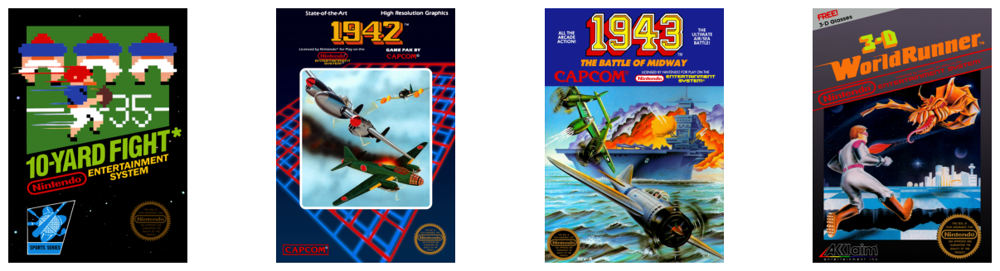

In [5]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset[:4]["image"]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

<div class="flex justify-center">
    <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/butterflies_ds.png"/>
</div>

The images are all different sizes though, so you'll need to preprocess them first:

* `Resize` changes the image size to the one defined in `config.image_size`.
* `RandomHorizontalFlip` augments the dataset by randomly mirroring the images.
* `Normalize` is important to rescale the pixel values into a [-1, 1] range, which is what the model expects.

In [6]:
from torchvision import transforms

preprocess = transforms.Compose(
    [
        transforms.Resize((config.image_size, config.image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

Use 🤗 Datasets' [set_transform](https://huggingface.co/docs/datasets/main/en/package_reference/main_classes#datasets.Dataset.set_transform) method to apply the `preprocess` function on the fly during training:

In [7]:
def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}


dataset.set_transform(transform)

Feel free to visualize the images again to confirm that they've been resized. Now you're ready to wrap the dataset in a [DataLoader](https://pytorch.org/docs/stable/data#torch.utils.data.DataLoader) for training!

In [8]:
import torch

train_dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True)

## Create a UNet2DModel

Pretrained models in 🧨 Diffusers are easily created from their model class with the parameters you want. For example, to create a [UNet2DModel](https://huggingface.co/docs/diffusers/main/en/api/models/unet2d#diffusers.UNet2DModel):

In [9]:
from diffusers import UNet2DModel

model = UNet2DModel(
    sample_size=config.image_size,  # the target image resolution
    in_channels=3,  # the number of input channels, 3 for RGB images
    out_channels=3,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(128, 128, 256, 256, 512, 512),  # the number of output channels for each UNet block
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",  # a regular ResNet upsampling block
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

It is often a good idea to quickly check the sample image shape matches the model output shape:

In [10]:
sample_image = dataset[0]["images"].unsqueeze(0)
print("Input shape:", sample_image.shape)

Input shape: torch.Size([1, 3, 128, 128])


In [11]:
print("Output shape:", model(sample_image, timestep=0).sample.shape)

Output shape: torch.Size([1, 3, 128, 128])


Great! Next, you'll need a scheduler to add some noise to the image.

## Create a scheduler

The scheduler behaves differently depending on whether you're using the model for training or inference. During inference, the scheduler generates image from the noise. During training, the scheduler takes a model output - or a sample - from a specific point in the diffusion process and applies noise to the image according to a *noise schedule* and an *update rule*.

Let's take a look at the [DDPMScheduler](https://huggingface.co/docs/diffusers/main/en/api/schedulers/ddpm#diffusers.DDPMScheduler) and use the `add_noise` method to add some random noise to the `sample_image` from before:

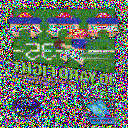

In [12]:
import torch
from PIL import Image
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

Image.fromarray(((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

<div class="flex justify-center">
    <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/noisy_butterfly.png"/>
</div>

The training objective of the model is to predict the noise added to the image. The loss at this step can be calculated by:

In [13]:
import torch.nn.functional as F

noise_pred = model(noisy_image, timesteps).sample
loss = F.mse_loss(noise_pred, noise)

## Train the model

By now, you have most of the pieces to start training the model and all that's left is putting everything together.

First, you'll need an optimizer and a learning rate scheduler:

In [14]:
from diffusers.optimization import get_cosine_schedule_with_warmup

optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)
lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

Then, you'll need a way to evaluate the model. For evaluation, you can use the [DDPMPipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/ddpm#diffusers.DDPMPipeline) to generate a batch of sample images and save it as a grid:

In [15]:
from diffusers import DDPMPipeline
import math
import os


def make_grid(images, rows, cols):
    w, h = images[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    for i, image in enumerate(images):
        grid.paste(image, box=(i % cols * w, i // cols * h))
    return grid


def evaluate(config, epoch, pipeline):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`
    images = pipeline(
        batch_size=config.eval_batch_size,
        generator=torch.manual_seed(config.seed),
    ).images

    # Make a grid out of the images
    image_grid = make_grid(images, rows=4, cols=4)

    # Save the images
    test_dir = os.path.join(config.output_dir, "samples")
    os.makedirs(test_dir, exist_ok=True)
    image_grid.save(f"{test_dir}/{epoch:04d}.png")

Now you can wrap all these components together in a training loop with 🤗 Accelerate for easy TensorBoard logging, gradient accumulation, and mixed precision training. To upload the model to the Hub, write a function to get your repository name and information and then push it to the Hub.

<Tip>

💡 The training loop below may look intimidating and long, but it'll be worth it later when you launch your training in just one line of code! If you can't wait and want to start generating images, feel free to copy and run the code below. You can always come back and examine the training loop more closely later, like when you're waiting for your model to finish training. 🤗

</Tip>

In [22]:
from accelerate import Accelerator
from huggingface_hub import HfFolder, Repository, whoami
from tqdm.auto import tqdm
from pathlib import Path
import os


def get_full_repo_name(model_id: str, organization: str = None, token: str = None):
    if token is None:
        token = HfFolder.get_token()
    if organization is None:
        username = whoami(token)["name"]
        return f"{username}/{model_id}"
    else:
        return f"{organization}/{model_id}"


def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps,
        log_with="tensorboard",
        project_dir=os.path.join(config.output_dir, "logs"),
    )
    if accelerator.is_main_process:
        if config.push_to_hub:
            repo_name = get_full_repo_name(Path(config.output_dir).name)
            repo = Repository(config.output_dir, clone_from=repo_name)
        elif config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        accelerator.init_trackers("train_example")

    # Prepare everything
    # There is no specific order to remember, you just need to unpack the
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )

    global_step = 0

    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images = batch["images"]
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape).to(clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps, (bs,), device=clean_images.device
            ).long()

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        # After each epoch you optionally sample some demo images with evaluate() and save the model
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    repo.push_to_hub(commit_message=f"Epoch {epoch}", blocking=True)
                else:
                    pipeline.save_pretrained(config.output_dir)

Phew, that was quite a bit of code! But you're finally ready to launch the training with 🤗 Accelerate's [notebook_launcher](https://huggingface.co/docs/accelerate/main/en/package_reference/launchers#accelerate.notebook_launcher) function. Pass the function the training loop, all the training arguments, and the number of processes (you can change this value to the number of GPUs available to you) to use for training:

In [23]:
from accelerate import notebook_launcher

args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)

notebook_launcher(train_loop, args, num_processes=1)

Launching training on one GPU.


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_deprecation.py:131: FutureWarning: 'Repository' (from 'huggingface_hub.repository') is deprecated and will be removed from version '1.0'. Please prefer the http-based alternatives instead. Given its large adoption in legacy code, the complete removal is only planned on next major release.
For more details, please read https://huggingface.co/docs/huggingface_hub/concepts/git_vs_http.
  warnings.warn(warning_message, FutureWarning)
Cloning https://huggingface.co/christianc750/ddpm-butterflies-128 into local empty directory.


OSError: WARNING: 'git lfs clone' is deprecated and will not be updated
          with new flags from 'git clone'

'git clone' has been updated in upstream Git to have comparable
speeds to 'git lfs clone'.
Cloning into '.'...
remote: Repository not found
fatal: repository 'https://huggingface.co/christianc750/ddpm-butterflies-128/' not found
Error(s) during clone:
git clone failed: exit status 128


Once training is complete, take a look at the final 🦋 images 🦋 generated by your diffusion model!

In [17]:
import glob

sample_images = sorted(glob.glob(f"{config.output_dir}/samples/*.png"))
Image.open(sample_images[-1])

IndexError: list index out of range

<div class="flex justify-center">
    <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/butterflies_final.png"/>
</div>

## Next steps

Unconditional image generation is one example of a task that can be trained. You can explore other tasks and training techniques by visiting the [🧨 Diffusers Training Examples](https://huggingface.co/docs/diffusers/main/en/tutorials/../training/overview) page. Here are some examples of what you can learn:

* [Textual Inversion](https://huggingface.co/docs/diffusers/main/en/tutorials/../training/text_inversion), an algorithm that teaches a model a specific visual concept and integrates it into the generated image.
* [DreamBooth](https://huggingface.co/docs/diffusers/main/en/tutorials/../training/dreambooth), a technique for generating personalized images of a subject given several input images of the subject.
* [Guide](https://huggingface.co/docs/diffusers/main/en/tutorials/../training/text2image) to finetuning a Stable Diffusion model on your own dataset.
* [Guide](https://huggingface.co/docs/diffusers/main/en/tutorials/../training/lora) to using LoRA, a memory-efficient technique for finetuning really large models faster.